In [ ]:
folder = "VirtualValtteri"
filename = "VirtualValtteri.vmkarting.2023-03-19-05-20-34.csv"
sensors = {
    'rotation': 'android.sensor.rotation_vector',
    'acceleration': 'Earth.Linear_Acceleration',
}



In [ ]:
import pandas as pd
from google.colab import drive
drive.mount('/content/drive')
fullpath = '/content/drive/MyDrive/' + folder +"/"+ filename
names=['timestamp','type','sensortype','vendor','version','x','y','z','zz','zz1','zz2','zz3','zz4','zz5','zz6','zz7','zz8','zz9','zz69','zz699','zz6999','zz69999','zz699099','zz6999999','zz69999199','z9z6','zz6999999999']
alldata = pd.read_csv(fullpath,names=names)
alldata.head(10)

Mounted at /content/drive


,timestamp,type,sensortype,vendor,version,x,y,z,zz,zz1,...,zz9,zz69,zz699,zz6999,zz69999,zz699099,zz6999999,zz69999199,z9z6,zz6999999999
0,970345271106824,10,android.sensor.linear_acceleration,qualcomm,1,0.000000,0.000000,0.000000,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,970345272073595,10,android.sensor.linear_acceleration,qualcomm,1,0.009317,0.004827,-0.017927,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,970345276978804,10,android.sensor.linear_acceleration,qualcomm,1,0.027705,0.027538,-0.059811,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,970345281884012,10,android.sensor.linear_acceleration,qualcomm,1,0.029747,0.028470,-0.066585,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,970345286789220,10,android.sensor.linear_acceleration,qualcomm,1,0.001663,0.021809,-0.051757,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,970345291694429,10,android.sensor.linear_acceleration,qualcomm,1,-0.012904,0.011534,-0.031807,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,970345296599637,10,android.sensor.linear_acceleration,qualcomm,1,-0.024826,-0.008847,-0.046662,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,970345301504845,10,android.sensor.linear_acceleration,qualcomm,1,-0.022118,-0.022349,-0.014806,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,970345306410054,10,android.sensor.linear_acceleration,qualcomm,1,-0.016823,-0.034265,0.008726,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,970345289402606,2,android.sensor.magnetic_field,memsic,20520568,-2.366800,-25.449200,-40.186800,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
acceleration=alldata.loc[alldata['sensortype']==sensors['acceleration']]
rotation=alldata.loc[alldata['sensortype']==sensors['rotation']]
#velocity=alldata.loc[alldata['sensortype']=='Velocity']
#magnetic=alldata.loc[alldata['sensortype']==sensors['magnetic']]
print(alldata.sensortype.unique())
print(alldata.size)
print(rotation.size)
print(acceleration.size)

['android.sensor.linear_acceleration' 'android.sensor.magnetic_field'
 'android.sensor.rotation_vector' 'android.sensor.gyroscope'
 'Earth.Linear_Acceleration' 'RaceEvent']
1751274
318276
318168


In [ ]:
good_interval_timestamps=[513284289775280+5000000000, rotation["timestamp"].to_numpy()[-1]-19000000000]
good_interval_timestamps=[rotation["timestamp"].to_numpy()[0], rotation["timestamp"].to_numpy()[-1]]

#print(rotation.count())
#rotation2=rotation.head(200).tail(140)
rotation2=rotation.loc[rotation["timestamp"]>=good_interval_timestamps[0]]
rotation2 = rotation2.loc[rotation2["timestamp"]<=good_interval_timestamps[1]]


acceleration2=acceleration.loc[acceleration["timestamp"]>=good_interval_timestamps[0]]
acceleration2 = acceleration2.loc[acceleration2["timestamp"]<=good_interval_timestamps[1]]

rotation2.head(4)


,timestamp,type,sensortype,vendor,version,x,y,z,zz,zz1,...,zz9,zz69,zz699,zz6999,zz69999,zz699099,zz6999999,zz69999199,z9z6,zz6999999999
12,970345291694429,11,android.sensor.rotation_vector,qualcomm,1,0.081731,0.134676,0.986553,0.043535,-1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
13,970345296599637,11,android.sensor.rotation_vector,qualcomm,1,0.081370,0.134648,0.986602,0.043188,-1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14,970345301504845,11,android.sensor.rotation_vector,qualcomm,1,0.080834,0.134507,0.986716,0.042017,-1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
15,970345306410054,11,android.sensor.rotation_vector,qualcomm,1,0.080383,0.134167,0.986810,0.041762,-1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
userot=rotation2
useacc=acceleration2

In [ ]:
r=userot
tmin=r.timestamp.to_numpy()[0]
print(tmin)
nanos=[t-tmin for t in r.timestamp]
minutes=[round((t-tmin)/1000.0/1000.0/1000.0/60.0,2) for t in r.timestamp]
print(minutes[-1])

a=useacc
accnanos=[t-tmin for t in a.timestamp]
accminutes=[round((t-tmin)/1000.0/1000.0/1000.0/60.0,2) for t in a.timestamp]
#print(accminutes[-1])
acceleration.head(4)

970345291694429
0.98


,timestamp,type,sensortype,vendor,version,x,y,z,zz,zz1,...,zz9,zz69,zz699,zz6999,zz69999,zz699099,zz6999999,zz69999199,z9z6,zz6999999999
34,970345314754845,65614,Earth.Linear_Acceleration,virtualvaltteri,1,0.097209,0.078004,-0.049138,0.0,0.0,...,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
35,970345319743491,65614,Earth.Linear_Acceleration,virtualvaltteri,1,0.122472,0.118545,-0.060684,0.0,0.0,...,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
36,970345324732137,65614,Earth.Linear_Acceleration,virtualvaltteri,1,0.195746,0.147728,-0.000485,0.0,0.0,...,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
37,970345329720783,65614,Earth.Linear_Acceleration,virtualvaltteri,1,0.253194,0.214955,0.116263,0.0,0.0,...,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
#/*quaternation to euler in XYZ (seq:123)*/
#https://stackoverflow.com/questions/30279065/how-to-get-the-euler-angles-from-the-rotation-vector-sensor-type-rotation-vecto

import math
def quat2eulerxyz(q):
  #/*euler-angles*/
  psi = math.atan2( -2.0 * (q[2]*q[3] - q[0]*q[1]) , q[0]*q[0] - q[1]*q[1]- q[2]*q[2] + q[3]*q[3] )
  theta = math.asin( 2.0 * (q[1]*q[3] + q[0]*q[2]) )
  phi = math.atan2( 2.0 * (-q[1]*q[2] + q[0]*q[3]) , q[0]*q[0] + q[1]*q[1] - q[2]*q[2] - q[3]*q[3] )
  e=[q[0]]*4
  e[1] = psi
  e[2] = theta
  e[3] = phi
  return e


In [ ]:
rot=userot.to_numpy()
qseries=[]
for r in rot:
  q1 = r[5]
  q2 = r[6]
  q3 = r[7]
  q0 = r[8]
  if len(qseries) % (len(rot)/100)==0:
    # print (str(q0)  +"    vs    "+ str(math.sqrt(1-q1*q1-q2*q2-q3*q3)))
    pass

  qseries.append([q0,q1,q2,q3])

angles=[]
rotx=[]
roty=[]
rotz=[]
for q in qseries:
  e = quat2eulerxyz(q)
  angles.append(e)
  rotx.append(e[1])
  roty.append(e[2])
  rotz.append(e[3])

rotzcorr=[(r  -90/180*math.pi +math.pi) % (2*math.pi) - math.pi for r in rotz]
#rotzcorr=rotz

print(angles[0:5])
print(max(rotx))
print(min(rotx))
print(max(roty))
print(min(roty))
print(max(rotz))
print(min(rotz))
print(max(rotzcorr))
print(min(rotzcorr))
print(rotz[0:15])
print(rotzcorr[0:15])

tmin=rot[0][0]
print(tmin)
times=[row[0]-tmin for row in rot]
minutes=[round(t/1000.0/1000.0/1000.0/60,3) for t in times]
print(minutes)


[[0.04353534, -0.26568665201954506, 0.1738658174967056, 3.0766838080600847], [0.043187562, -0.26569743983218413, 0.17305276084829413, 3.077283311338185], [0.04201718, -0.26561915717731166, 0.17166474354767455, 3.0794675562482605], [0.04176228, -0.26497554526856404, 0.17067896701116667, 3.0798026592905283], [0.038833257, -0.2642026278475961, 0.16657930064657386, 3.0851401988737712]]
0.6036885778798196
-0.5476680610027874
0.6639359693842052
-0.5295384385243938
3.1409899610830965
-3.1413705237096172
3.1410794957632584
-3.141457535459738
[3.0766838080600847, 3.077283311338185, 3.0794675562482605, 3.0798026592905283, 3.0851401988737712, 3.0820506027384784, 3.087756717403835, 3.0919152716679372, 3.0995830068890036, 3.1049469210946308, 3.113110713170271, 3.115658955410031, 3.1210251636671593, 3.1250508149586813, 3.125125134976958]
[1.5058874812651881, 1.5064869845432884, 1.5086712294533644, 1.5090063324956322, 1.514343872078875, 1.5112542759435819, 1.5169603906089382, 1.5211189448730407, 1.52

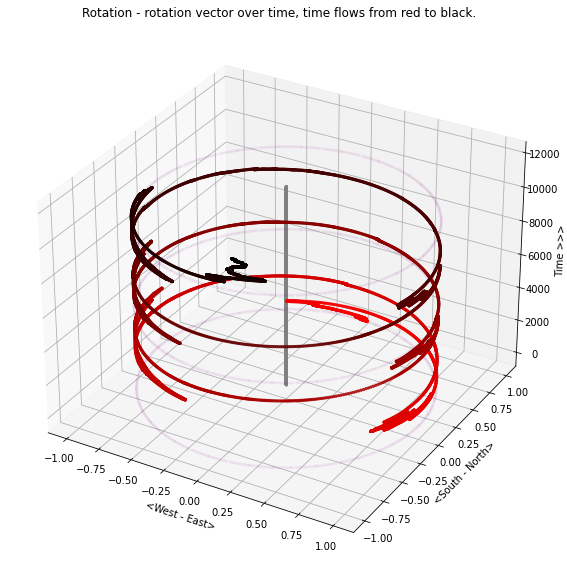

In [ ]:
useaxis=rotz
useaxis=rotzcorr

import matplotlib.pyplot as plt
import numpy as np
import math
import random

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(projection='3d')
plt.title("Rotation - rotation vector over time, time flows from red to black.")


r=userot.to_numpy()
ts=[row[0] for row in r]
xs=[math.cos(a) for a in useaxis]
ys=[math.sin(a) for a in useaxis]
zs=[len(xs)-i for i in range(0,len(xs))]

colors=['white']*len(xs)
for i in range(0,len(colors)):
  colors[i]=((len(colors)-i)/len(colors),0,0)
zeros=[0]*len(xs)
consttime=range(0,len(xs))

ax.scatter(xs, ys, consttime, marker='.', color=colors, alpha=0.8)

ax.scatter(zeros, zeros, zs, marker='.', color='gray', alpha=0.1)
circlex=[math.cos(x) for x in range(0,360)]
circley=[math.sin(y) for y in range(0,360)]
for i in range(0,len(colors),5000):
  ax.scatter(circlex, circley, i, marker='.', color='purple', alpha=0.05)


ax.set_xlabel('<West - East>')
ax.set_ylabel('<South - North>')
ax.set_zlabel('Time >>>')


plt.show()

(0.9999999997639426, -0.017234190185139248, -0.9999999908715455)
(0.9999999753291583, -0.15159986980398216, -0.9999994824773708)


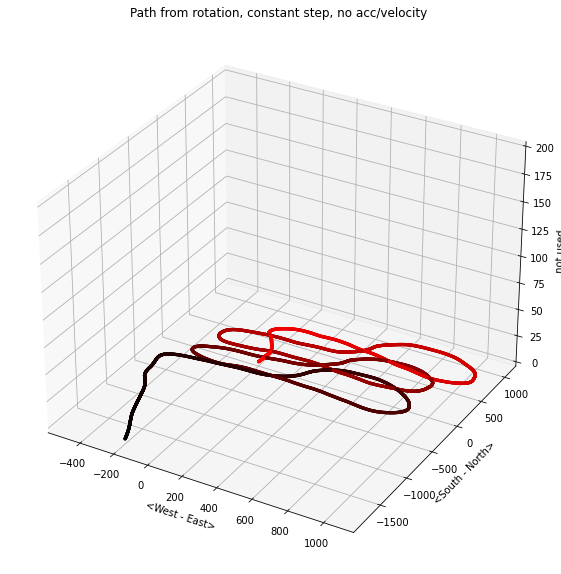

In [ ]:
useaxis=rotz
useaxis=rotzcorr

from statistics import mean

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(projection='3d')
ax.set_zlim(0,200)
plt.title("Rotation - path from red to black, assuming constant speed, ignoring actual acceleration.")


r=userot.to_numpy()
rts=[row[0] for row in r]
rxs=[math.cos(a) for a in useaxis]
rys=[math.sin(a) for a in useaxis]
consttime=[len(xs)-i for i in range(0,len(rxs))]

rxxs=[x for x in rxs]
ryys=list(rys)

for i in range(1,len(rxxs)):
  rxxs[i]=rxxs[i-1]+rxxs[i]
  ryys[i]=ryys[i-1]+ryys[i]

#zzs=range(0,len(zzs)
zeros=[0.0]*len(rxxs)
colors=['yellow']*len(rxxs)
for i in range(0,len(colors)):
  colors[i]=((len(colors)-i)/len(colors),0,0)

ax.scatter(rxxs, ryys, zeros, marker='.', color=colors, alpha=0.5)

print((max(rxs), mean(rxs),min(rxs)))
print((max(rys),mean(rys),min(rys)))

ax.set_title("Path from rotation, constant step, no acc/velocity")
ax.set_xlabel('<West - East>')
ax.set_ylabel('<South - North>')
ax.set_zlabel('not used')

plt.show()



In [ ]:
a=useacc
axs=fig.subplots(3,1)
#print(smoothx.array)
o=axs[0].scatter(accminutes,a.x.to_numpy(), label="x", alpha=0.7, color='blue')
o=axs[1].scatter(accminutes,a.y.to_numpy(), label="y", alpha=0.7, color='orange')
o=axs[2].scatter(accminutes,a.z.to_numpy(), label="z", alpha=0.7, color='purple')
o=fig.legend()
plt.show()

window size
1102


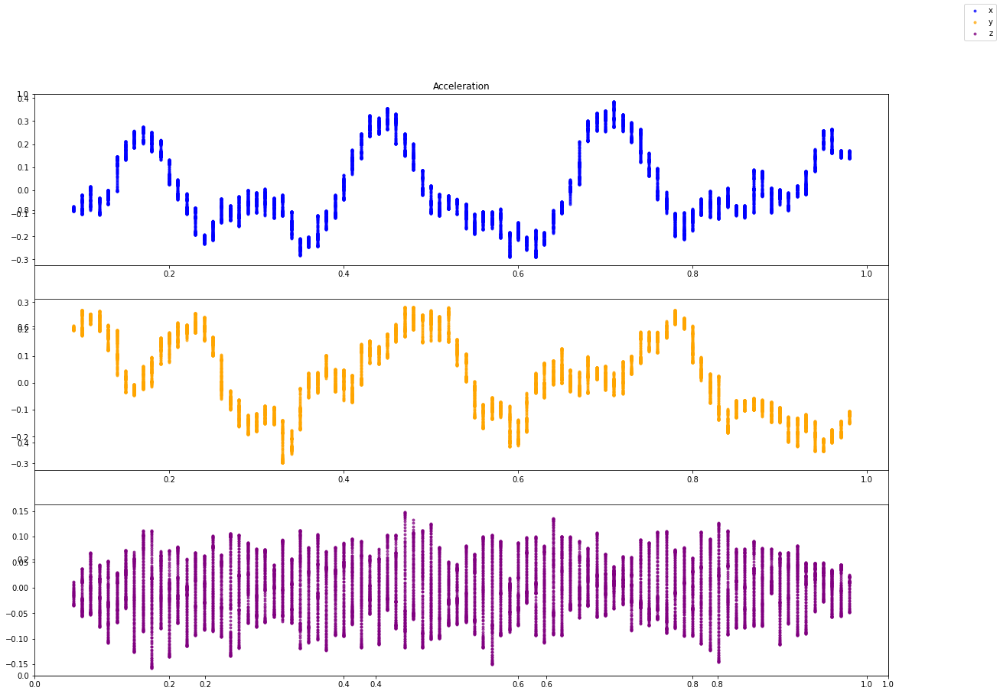

In [ ]:
a=useacc

mx = alldata.timestamp.max()
mi = alldata.timestamp.min()
num = alldata.timestamp.size
points_in_100ms = int(num/((mx-mi)/1000.0/1000.0/100.0))
points_in_10ms = int(num/((mx-mi)/1000.0/1000.0/10.0))
points_in_1ms = int(num/((mx-mi)/1000.0/1000.0))
points_in_1s = int(num/((mx-mi)/1000.0/1000.0/1000.0))
window_size=points_in_100ms
window_size=points_in_1s
#window_size=max(points_in_1ms,2)
print("window size")
print(window_size)


smoothx=a.x.rolling(window_size).mean()
smoothy=a.y.rolling(window_size).mean()
smoothz=a.z.rolling(window_size).mean()
smootht=a.timestamp.tail(a.size-window_size)
fig = plt.figure(figsize=(20,14))
plt.title("Acceleration")


# Arbitrary corrections to make it match reality...
#smoothx=[-y for y in a.y.rolling(window_size).mean()]
#smoothy=[-x for x in a.x.rolling(window_size).mean()]
#smoothx=a.y.rolling(window_size).mean()
#smoothy=a.x.rolling(window_size).mean()
#smoothy=[-y for y in smoothy]




x=smoothx
y=smoothy
z=smoothz
ts=smootht

axs=fig.subplots(3,1)

#print(smoothx.array)
o=axs[0].scatter(accminutes,x, label="x", alpha=0.7, color='blue', marker='.')
o=axs[1].scatter(accminutes,y, label="y", alpha=0.7, color='orange', marker='.')
o=axs[2].scatter(accminutes,z, label="z", alpha=0.7, color='purple', marker='.')
o=fig.legend()

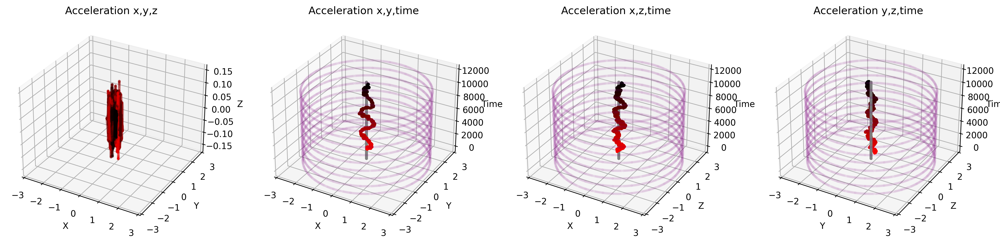

In [ ]:
useaxis=smoothx
useaxis2=smoothy
useaxis3=smoothz

import matplotlib.pyplot as plt
import numpy as np
import math
import random

fig = plt.figure(figsize=(20,40),dpi=300)
#ax = fig.add_subplot(projection='3d')
#ax.set_xlim(-5,5)
#ax.set_ylim(-5,5)
#axs=fig.subplots(1,4,projection='3d')
#for ax in axs:



xs=[a for a in useaxis]
ys=[a for a in useaxis2]
zs=[a for a in useaxis3]
pole=[len(xs)-i for i in range(0,len(xs))]

colors=['white']*(len(xs)-window_size+1)
for i in range(0,len(colors)):
  colors[i]=list(((len(colors)-i)/len(colors),0.0,0.0))
zeros=[0]*len(xs)
consttime=range(0,len(xs))
circlex=[3*math.cos(x) for x in range(0,360)]
circley=[3*math.sin(y) for y in range(0,360)]

#ax.scatter(xs, ys, consttime, marker='.', color=colors, alpha=0.2)
axs=[]
for i in range(0,4):
  ax = fig.add_subplot(1, 4, i+1, projection='3d')
  ax.set_xlim(-3,3)
  ax.set_ylim(-3,3)
  axs.append(ax)
axs[0].scatter(xs,ys,zs, alpha=0.2, color=colors, marker='.')
axs[1].scatter(xs,ys,consttime, alpha=0.3, color=colors, marker='.')
axs[2].scatter(xs,zs,consttime, alpha=0.3, color=colors, marker='.')
axs[3].scatter(ys,zs,consttime, alpha=0.3, color=colors, marker='.')

for i in range(1,4):
  axs[i].scatter(zeros*2, zeros*2, pole*2, marker='.', color='gray', alpha=0.1)
  num_circles=10
  for z in range(0,num_circles):
    axs[i].scatter(circlex, circley, [z/num_circles*consttime[-1]]*360, marker='.', color='purple', alpha=0.05)

axs[0].set_title("Acceleration x,y,z")
axs[0].set_xlabel('X')
axs[0].set_ylabel('Y')
axs[0].set_zlabel('Z')
axs[1].set_title("Acceleration x,y,time")
axs[1].set_xlabel('X')
axs[1].set_ylabel('Y')
axs[1].set_zlabel('Time')
axs[2].set_title("Acceleration x,z,time")
axs[2].set_xlabel('X')
axs[2].set_ylabel('Z')
axs[2].set_zlabel('Time')
axs[3].set_title("Acceleration y,z,time")
axs[3].set_xlabel('Y')
axs[3].set_ylabel('Z')
axs[3].set_zlabel('Time')

plt.show()

11784
11784
[nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan]
[[1.0, 0.0, 0.0], [0.9999151391717583, 0.0, 0.0], [0.9998302783435167, 0.0, 0.0], [0.9997454175152749, 0.0, 0.0], [0.9996605566870332, 0.0, 0.0], [0.9995756958587916, 0.0, 0.0], [0.9994908350305499, 0.0, 0.0], [0.9994059742023083, 0.0, 0.0], [0.9993211133740665, 0.0, 0.0], [0.9992362525458248, 0.0, 0.0], [0.9991513917175832, 0.0, 0.0], [0.9990665308893415, 0.0, 0.0], [0.9989816700610998, 0.0, 0.0], [0.9988968092328581, 0.0, 0.0], [0.9988119484046164, 0.0, 0.0], [0.9987270875763747, 0.0, 0.0], [0.9986422267481331, 0.0, 0.0], [0.9985573659198914, 0.0, 0.0], [0.9984725050916496, 0.0, 0.0], [0.998387644263408, 0.0, 0.0]]


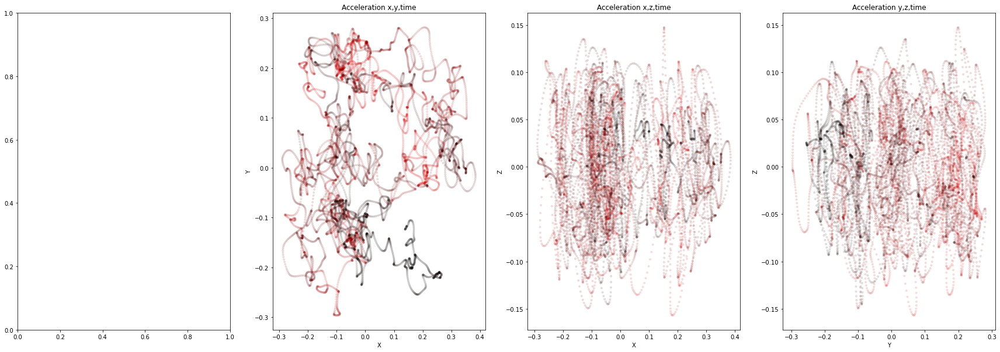

In [ ]:
useaxis=smoothx
useaxis2=smoothy
useaxis3=smoothz
ts=[row for row in smootht]
xs=[row for row in smoothx]
ys=[row for row in smoothy]
zs=[row for row in smoothz]


import matplotlib.pyplot as plt
import numpy as np
import math
import random

fig = plt.figure(figsize=(30,10))
#ax = fig.add_subplot(projection='3d')
#ax.set_xlim(-5,5)
#ax.set_ylim(-5,5)
#axs=fig.subplots(1,4,projection='3d')
#for ax in axs:



#xs=[a for a in useaxis]
#ys=[a for a in useaxis2]
#zs=[a for a in useaxis3]
pole=[len(xs)-i for i in range(0,len(xs))]

colors=['white']*(len(xs))
for i in range(0,len(colors)):
  colors[i]=list(((len(colors)-i)/len(colors),0.0,0.0))
zeros=[0]*len(xs)
consttime=range(0,len(xs))
circlex=[3*math.cos(x) for x in range(0,360)]
circley=[3*math.sin(y) for y in range(0,360)]

#ax.scatter(xs, ys, consttime, marker='.', color=colors, alpha=0.2)
axs=[]
for i in range(0,4):
  ax = fig.add_subplot(1, 4, i+1)
  axs.append(ax)
print(len(xs))
print(len(colors))
print(xs[0:20])
print(colors[0:20])
axs[1].scatter(xs,ys, alpha=0.1, color=colors, marker='.')
axs[2].scatter(xs,zs, alpha=0.1, color=colors, marker='.')
axs[3].scatter(ys,zs, alpha=0.1, color=colors, marker='.')

axs[1].set_title("Acceleration x,y,time")
axs[1].set_xlabel('X')
axs[1].set_ylabel('Y')
axs[2].set_title("Acceleration x,z,time")
axs[2].set_xlabel('X')
axs[2].set_ylabel('Z')
axs[3].set_title("Acceleration y,z,time")
axs[3].set_xlabel('Y')
axs[3].set_ylabel('Z')

plt.show()

In [ ]:
import math
def rotate_x(yzangle,x,y,z):
  xaxis=[x,
         y*math.cos(yzangle) - z * math.sin(yzangle),
         y*math.sin(yzangle) + z * math.cos(yzangle)]
  return xaxis

def rotate_y(xzangle,x,y,z):
  yaxis=[x * math.cos(xzangle) + z * math.sin(xzangle),
         y,
         -x * math.sin(xzangle) + z * math.cos(xzangle)]
  return yaxis

def rotate_xy(yzangle,xzangle,x,y,z):
  x,y,z = rotate_x(yzangle,x,y,z)
  x,y,z = rotate_y(xzangle,x,y,z)
  return x,y,z

def rotate_z(xyangle,x,y,z):
  zaxis=[x * math.cos(xyangle) - y * math.sin(xyangle),
         x * math.cos(xyangle) + y * math.cos(xyangle),
         z]
  return zaxis;

max-mean-min
(0.3846879505534483, 0.008226694117830852, -0.2899332075634301)
(0.2818649334999365, 0.019480022780615926, -0.2963076372054447)
(0.14766439185299454, -0.0007364485369557682, -0.1570317057321234)
10681
max-mean-min
(0.36432521981828675, -0.2507577338889756, -1.0575638575962856)
(1.5093722204164632, 0.9819083544585063, 0.18398000886961946)
(-0.033197718798579266, -0.10846156275318082, -0.16459164914570432)
[-0.07384256301779213, -0.07421094658517953, -0.07457935931742728, -0.0749478269011516, -0.07531638040457686, -0.07568505430332456, -0.07605388096888693, -0.0764228880873443, -0.07679209246371536, -0.07716149540353852, -0.07753109321971585, -0.077900902644398, -0.07827090723932868, -0.07864107734332552, -0.07901138679428785, -0.07938183044846757, -0.07975242495136534, -0.08012320316790786, -0.08049420958489269, -0.08086549675449224, -0.08123711810017292, -0.0816091269958317, -0.08198156863053538, -0.08235447463944635, -0.08272786118013842, -0.08310173054810219, -0.08347607

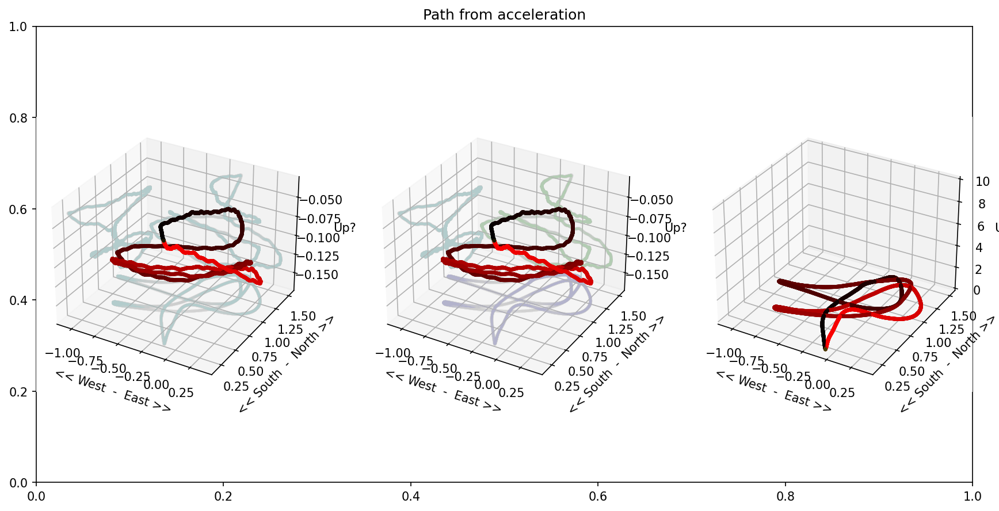

In [ ]:
#NotebookApp.iopub_data_rate_limit=5000000.0

import time

fig = plt.figure(figsize=(14,7),dpi=150)
plt.title("Path from acceleration")

ts=[row for row in smootht]
xs=[row for row in smoothx]
ys=[row for row in smoothy]
zs=[row for row in smoothz]
ts=ts[window_size:-1]
xs=xs[window_size:-1]
ys=ys[window_size:-1]
zs=zs[window_size:-1]

print("max-mean-min")
print((max(xs),mean(xs),min(xs)))
print((max(ys),mean(ys),min(ys)))
print((max(zs),mean(zs),min(zs)))


#ts=range(1,len(ts)*4988334,4988334)
N2S=1/1000.0/1000.0/1000.0
#N2S=1
reset_every=100000000
vdecay=0.995
def decay2(vx,vy,vz):
  return vdecay
  magnitude=math.sqrt(vx*vx+vy*vy+vz*vz)
  m2=magnitude*magnitude
  decay=1000000/(m2+1000000)*vdecay
  return decay

def dynamic_reset(vx,vy,vz):
  return vx,vy,vz
  magnitude=math.sqrt(vx*vx+vy*vy+vz*vz)
  m2=magnitude*magnitude
  if magnitude>5:
    return vx/2,vy/2,vz/2
    return 0,0,0
  else:
    return vx,vy,vz


xmean=mean(xs)
ymean=mean(ys)
zmean=mean(zs)
print(len(ts))

#VELOCITY
def acc2vel(xs,ys,zs):
  vxs=[x-xmean for x in xs]
  vys=[y-ymean for y in ys]
  vzs=[z-zmean for z in zs]
  for i in range(1,len(vxs)):
    vdecay=decay2(xs[i],ys[i],zs[i])
    vxs[i-1]
    vxs[i]
    ts[i-1]
    ts[i]
    vxs[i]=vdecay*vxs[i-1]+vxs[i]*(ts[i]-ts[i-1])*N2S
    vys[i]=vdecay*vys[i-1]+vys[i]*(ts[i]-ts[i-1])*N2S
    vzs[i]=vdecay*vzs[i-1]+vzs[i]*(ts[i]-ts[i-1])*N2S
    if i%reset_every==0:
      print("reset velocity so it doesn't grow unbounded")
      vxs[i]=0.0
      vys[i]=0.0
      vzs[i]=0.0
    x,y,z = dynamic_reset(vxs[i],vys[i],vzs[i])
    vxs[i]=x
    vys[i]=y
    vzs[i]=z

  return vxs,vys,vzs



#POSITION
def vel2pos(vxs,vys,vzs):
  vdecay=1
  xmean=mean(vxs)
  ymean=mean(vys)
  zmean=mean(vzs)
  xxs=[x-xmean for x in vxs]
  yys=[y-ymean for y in vys]
  zzs=[z-zmean for z in vzs]

  for i in range(1,len(xxs)):
    xxs[i]=vdecay*xxs[i-1]+xxs[i]*(ts[i]-ts[i-1])*N2S

  for i in range(1,len(xxs)):
    yys[i]=vdecay*yys[i-1]+yys[i]*(ts[i]-ts[i-1])*N2S

  for i in range(1,len(xxs)):
    zzs[i]=vdecay*zzs[i-1]+zzs[i]*(ts[i]-ts[i-1])*N2S

  return xxs,yys,zzs

vxs,vys,vzs = acc2vel(xs,ys,zs)
xxs,yys,zzs = vel2pos(vxs,vys,vzs)

print("max-mean-min")
print((max(xxs),mean(xxs),min(xxs)))
print((max(yys),mean(yys),min(yys)))
print((max(zzs),mean(zzs),min(zzs)))
print(xxs[0:100])
print(yys[0:100])
print(zzs[0:100])

zeros=[0.0]*len(xxs)
colors=['yellow']*len(xxs)
for i in range(0,len(colors)):
  colors[i]=((len(colors)-i)/len(colors),0,0)
  if i%reset_every==0:
    colors[i]='yellow'

ax = fig.add_subplot(1,3,1,projection='3d')
ax.scatter(xxs, yys, zzs, marker='.', color=colors, alpha=0.5)


ax.scatter(xxs, yys, [min(zzs)]*len(zzs), marker='.', color=(0.7,0.8,0.8), alpha=0.005)
ax.scatter(xxs, [max(yys)]*len(yys), zzs, marker='.', color=(0.7,0.8,0.8), alpha=0.005)
ax.scatter([min(xxs)]*len(xxs), yys, zzs, marker='.', color=(0.7,0.8,0.8), alpha=0.005)

ax.set_xlabel('<< West  -  East >>')
ax.set_ylabel('<< South  -  North >>')
ax.set_zlabel('Up?')
#ax.set_zlim(0,200)


v=[min(xxs),max(xxs),min(yys),max(yys),min(zzs),max(zzs)]
pratio=[(v[5]-v[4])/(v[1]-v[0]),(v[5]-v[4])/(v[3]-v[2]),(v[3]-v[2])/(v[1]-v[0])]
print("Spread of z values vs x and y axis")
print(pratio)

xzangle=math.atan2((v[5]-v[4]),(v[1]-v[0]))
yzangle=math.atan2((v[5]-v[4]),(v[3]-v[2]))
print("xzangle,yzangle")
print(xzangle,yzangle)
#xzangle=0.2866991586860137
#yzangle=0.45732963470206117
#xyplane=[rotate_x(-yzangle/10,x,y,z) for x,y,z in zip(xs,ys,zs)]

#xs =[x for x,y,z in xyplane]
#ys =[y for x,y,z in xyplane]
#zs =[z for x,y,z in xyplane]

vxs,vys,vzs = acc2vel(xs,ys,zs)
xxs,yys,zzs = vel2pos(vxs,vys,vzs)


print("max-mean-min")
print((max(xxs),mean(xxs),min(xxs)))
print((max(yys),mean(yys),min(yys)))
print((max(zzs),mean(zzs),min(zzs)))
v=[min(xxs),max(xxs),min(yys),max(yys),min(zzs),max(zzs)]
pratio=[(v[5]-v[4])/(v[1]-v[0]),(v[5]-v[4])/(v[3]-v[2]),(v[3]-v[2])/(v[1]-v[0])]
print("Spread of z values vs x and y axis")
print(pratio)


xzangle=math.atan2((v[5]-v[4]),(v[1]-v[0]))
yzangle=math.atan2((v[5]-v[4]),(v[3]-v[2]))
print("xzangle,yzangle")
print(xzangle,yzangle)
#xzangle=0.2866991586860137
#yzangle=0.45732963470206117
#xyplane=[rotate_y(-xzangle/5,x,y,z) for x,y,z in zip(xs,ys,zs)]

#xs =[x for x,y,z in xyplane]
#ys =[y for x,y,z in xyplane]
#zs =[z for x,y,z in xyplane]

vxs,vys,vzs = acc2vel(xs,ys,zs)
xxs,yys,zzs = vel2pos(vxs,vys,vzs)









print("max-mean-min")
print((max(xxs),mean(xxs),min(xxs)))
print((max(yys),mean(yys),min(yys)))
print((max(zzs),mean(zzs),min(zzs)))
v=[min(xxs),max(xxs),min(yys),max(yys),min(zzs),max(zzs)]
pratio=[(v[5]-v[4])/(v[1]-v[0]),(v[5]-v[4])/(v[3]-v[2]),(v[3]-v[2])/(v[1]-v[0])]
print("Spread of z values vs x and y axis")
print(pratio)
xzangle=math.atan2((v[5]-v[4]),(v[1]-v[0]))
yzangle=math.atan2((v[5]-v[4]),(v[3]-v[2]))
print("xzangle,yzangle")
print(xzangle,yzangle)




zeros=[0.0]*len(xxs)
colors=['yellow']*len(xxs)
for i in range(0,len(colors)):
  colors[i]=((len(colors)-i)/len(colors),0,0)
  if i%reset_every==0:
    colors[i]='yellow'


ax2 = fig.add_subplot(1,3,2,projection='3d')
ax2.scatter(xxs, yys, zzs, marker='.', color=colors, alpha=0.5)

ax2.scatter(xxs, yys, [min(zzs)]*len(zzs), marker='.', color=(0.7,0.7,0.8), alpha=0.005)
ax2.scatter(xxs, [max(yys)]*len(yys), zzs, marker='.', color=(0.7,0.8,0.7), alpha=0.005)
ax2.scatter([min(xxs)]*len(xxs), yys, zzs, marker='.', color=(0.7,0.8,0.8), alpha=0.005)

ax2.set_xlabel('<< West  -  East >>')
ax2.set_ylabel('<< South  -  North >>')
ax2.set_zlabel('Up?')

ax = fig.add_subplot(1,3,3,projection='3d')
ax.scatter(xxs, yys, zeros, marker='.', color=colors, alpha=0.5)

ax.set_zlim(0,10)
ax.set_xlabel('<< West  -  East >>')
ax.set_ylabel('<< South  -  North >>')
ax.set_zlabel('Up?')

print((max(xxs),mean(xxs),min(xxs)))
print((max(yys),mean(yys),min(yys)))
print((max(zzs),mean(zzs),min(zzs)))

plt.show()

(0.36432521981828675, -0.2507577338889756, -1.0575638575962856)
(1.5093722204164632, 0.9819083544585063, 0.18398000886961946)
(-0.033197718798579266, -0.10846156275318082, -0.16459164914570432)


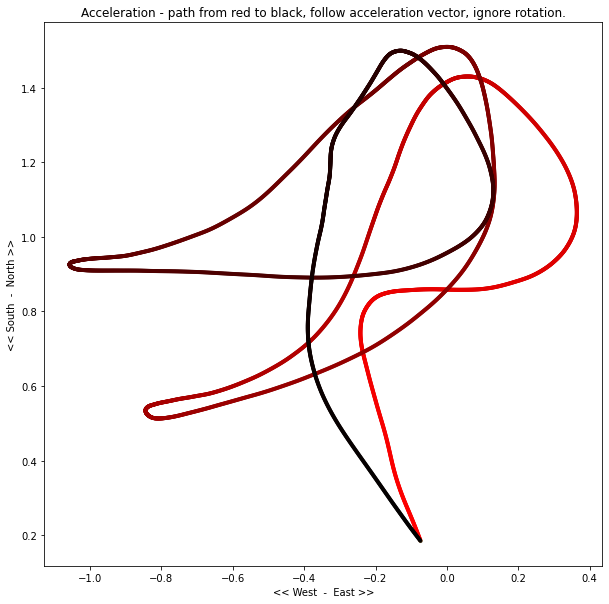

In [ ]:
#a=useacc.to_numpy()
#NotebookApp.iopub_data_rate_limit=5000000.0



fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()
#ax.set_zlim(0,200)
#
ax.scatter(xxs, yys, marker='.', color=colors, alpha=0.5)

ax.set_xlabel('<< West  -  East >>')
ax.set_ylabel('<< South  -  North >>')

print((max(xxs),mean(xxs),min(xxs)))
print((max(yys),mean(yys),min(yys)))
print((max(zzs),mean(zzs),min(zzs)))
plt.title("Acceleration - path from red to black, follow acceleration vector, ignore rotation.")

plt.show()

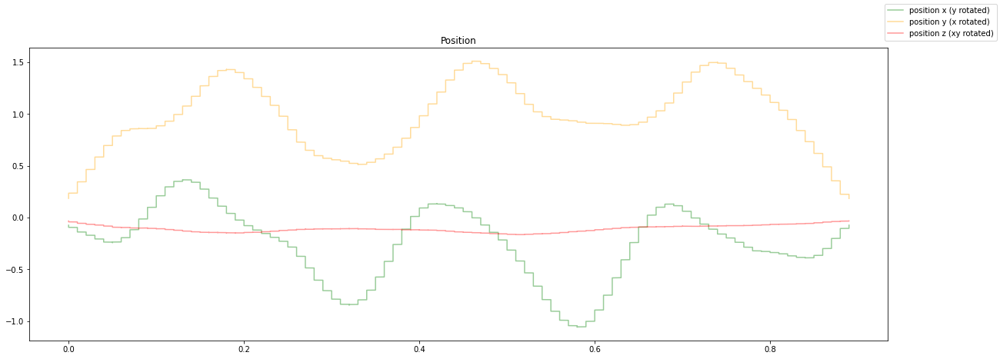

(-1.0575638575962856, 0.18398000886961946, -0.16459164914570432)

In [ ]:
fig = plt.figure(figsize=(20,7))
ax = fig.add_subplot()


t=accminutes[0:len(xxs)]
o=ax.plot(t,xxs, label="position x (y rotated)", alpha=0.4, color='green')
o=ax.plot(t,yys, label="position y (x rotated)", alpha=0.4, color='orange')
o=ax.plot(t,zzs, label="position z (xy rotated)", alpha=0.4, color='red')
ax.set_title("Position")
o=fig.legend()
plt.show()
min(xxs),min(yys),min(zzs)

(-3.141320141848304, -179.9843862273449, 3.1412464341882527, 179.9801630895062)
(-0.2899332075634301, -0.2963076372054447, 0.3846879505534483, 0.2818649334999365, -0.05783243794373948, 0.06787213293115943)
(-0.9999999628686757, -0.9999998607945814, 0.9999999998166532, 0.9999999777199674, -0.4999999978661513, 0.49999999299872805)


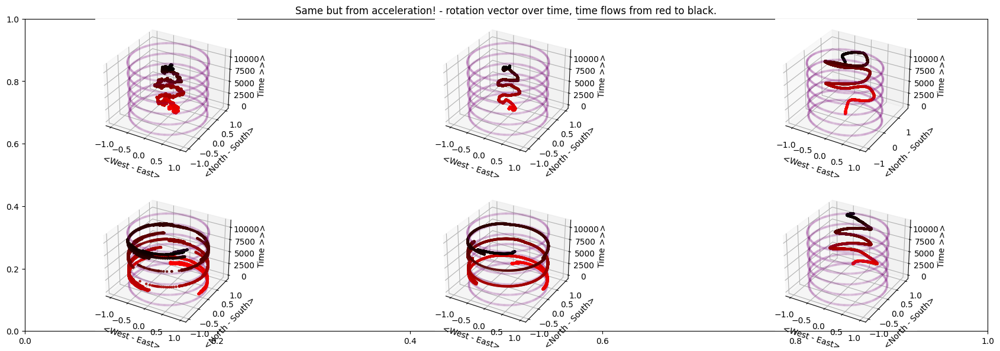

In [ ]:
#useaxis=rotz
ts=[row for row in smootht]
xs=[row for row in smoothx]
ys=[row for row in smoothy]
zs=[row for row in smoothz]
ts=ts[window_size:-1]
xs=xs[window_size:-1]
ys=ys[window_size:-1]
zs=zs[window_size:-1]




import matplotlib.pyplot as plt
import numpy as np
import math
import random
def acc2rot_z(xs,ys,zs):
  acc_xyangles=[]
  for i in range(1,len(xs)):
    angle=math.atan2(ys[i],xs[i])
    acc_xyangles.append(angle)
  return acc_xyangles




fig = plt.figure(figsize=(21,7),dpi=100)
plt.title("Same but from acceleration! - rotation vector over time, time flows from red to black.")

useaxis=acc2rot_z(xs,ys,zs)
print((min(useaxis),np.rad2deg(min(useaxis)),max(useaxis),np.rad2deg(max(useaxis))))


def rot2vec(useaxis):
  xs=[math.cos(a) for a in useaxis]
  ys=[math.sin(a) for a in useaxis]
  return xs,ys

def helpers(xs):
  colors=['white']*len(xs)
  for i in range(0,len(colors)):
    colors[i]=((len(colors)-i)/len(colors),0,0)
  zeros=[0]*len(xs)
  consttime=range(0,len(xs))
  return colors, zeros, consttime

def drawit(ax, xs,ys,colors, zeros, consttime):
  ax.scatter(xs, ys, consttime, marker='.', color=colors, alpha=0.8)
  #ax.scatter(zeros, zeros, zs, marker='.', color='gray', alpha=0.1)
  circlex=[math.cos(x) for x in range(0,360)]
  circley=[math.sin(y) for y in range(0,360)]
  for i in range(0,len(colors),int(max(consttime)/5)):
    ax.scatter(circlex, circley, consttime[i], marker='.', color='purple', alpha=0.05)

  ax.set_xlabel('<West - East>')
  ax.set_ylabel('<North - South>')
  ax.set_zlabel('Time >>>')

colors, zeros, consttime = helpers(xs)
print((min(xs),min(ys),max(xs),max(ys),min([x*y for x,y in zip(xs,ys)]),max([x*y for x,y in zip(xs,ys)])))
ax = fig.add_subplot(2,3,1,projection='3d')
drawit(ax, xs,ys,colors, zeros, consttime)

colors, zeros, consttime = helpers(vxs)
#print((min(xs),min(ys),max(xs),max(ys),min([x*y for x,y in zip(xs,ys)]),max([x*y for x,y in zip(xs,ys)])))
ax = fig.add_subplot(2,3,2,projection='3d')
drawit(ax, vxs,vys,colors, zeros, consttime)

colors, zeros, consttime = helpers(xxs)
#print((min(xs),min(ys),max(xs),max(ys),min([x*y for x,y in zip(xs,ys)]),max([x*y for x,y in zip(xs,ys)])))
ax = fig.add_subplot(2,3,3,projection='3d')
drawit(ax, xxs,yys,colors, zeros, consttime)



xs,ys = rot2vec(useaxis)
colors, zeros, consttime = helpers(xs)
print((min(xs),min(ys),max(xs),max(ys),min([x*y for x,y in zip(xs,ys)]),max([x*y for x,y in zip(xs,ys)])))
ax = fig.add_subplot(2,3,4,projection='3d')
drawit(ax, xs,ys,colors, zeros, consttime)


useaxis=acc2rot_z(vxs,vys,vzs)
xs,ys = rot2vec(useaxis)
colors, zeros, consttime = helpers(xs)
ax = fig.add_subplot(2,3,5,projection='3d')
drawit(ax, xs,ys,colors, zeros, consttime)

useaxis=acc2rot_z(xxs,yys,zzs)
xs,ys = rot2vec(useaxis)
ax = fig.add_subplot(2,3,6,projection='3d')
drawit(ax, xs,ys,colors, zeros, consttime)
#

plt.show()

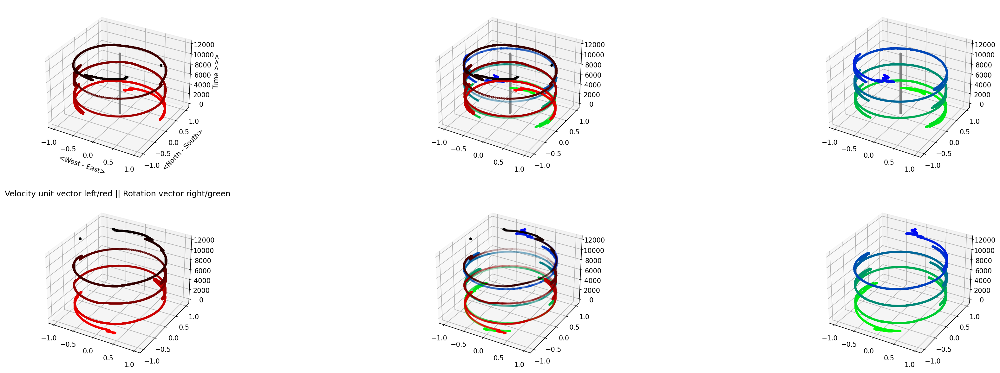

In [ ]:

def acc2rot_z(xs,ys,zs):
  acc_xyangles=[]
  for i in range(1,len(xs)):
    angle=math.atan2(ys[i],xs[i])
    acc_xyangles.append(angle)
  return acc_xyangles




import matplotlib.pyplot as plt
import numpy as np
import math
import random



fig = plt.figure(figsize=(30,10),dpi=150)
ax = fig.add_subplot(2,3,1,projection='3d')
ax4 = fig.add_subplot(2,3,4,projection='3d')

plt.title("Velocity unit vector left/red || Rotation vector right/green")

#Make them equal length...
ratio = len(vxs)/len(rotz)
period = int(math.ceil(1/(1-ratio)))
lvxs = [0.0]*(len(rotz))
lvys = [0.0]*(len(rotz))
lvzs = [0.0]*(len(rotz))
shift=0
for i in range(0, len(vxs)-period):
  if i+shift+1>len(lvxs):
    print("i={}, shift={}, period={}, len(lvxs)={}",i,shift,period, len(lvxs))
    break
  lvxs[i+shift]=vxs[i]
  lvys[i+shift]=vys[i]
  lvzs[i+shift]=vzs[i]
  if i % period == 0 and i>0:
    shift += 1
    lvxs[i+shift]=lvxs[i+shift-1]
    lvys[i+shift]=lvys[i+shift-1]
    lvzs[i+shift]=lvzs[i+shift-1]



accangles=acc2rot_z(lvxs,lvys,lvzs)
xs=[math.cos(a) for a in accangles]
ys=[math.sin(a) for a in accangles]
zs=[len(xs)-i for i in range(0,len(xs))]

colors=['white']*len(xs)
for i in range(0,len(colors)):
  colors[i]=((len(colors)-i)/len(colors),0,0)
zeros=[0]*len(xs)
consttime=range(0,len(xs))

ax.scatter(xs, ys, consttime, marker='.', color=colors, alpha=0.8)
ax4.scatter([-x for x in xs], [-x for x in ys], consttime, marker='.', color=colors, alpha=0.8)

ax.scatter(zeros, zeros, zs, marker='.', color='gray', alpha=0.1)
circlex=[math.cos(x) for x in range(0,360)]
circley=[math.sin(y) for y in range(0,360)]
#for i in range(0,len(colors),int(len(colors)/10)):
#  ax.scatter(circlex, circley, consttime[i], marker='.', color='purple', alpha=0.05)


ax.set_xlabel('<West - East>')
ax.set_ylabel('<North - South>')
ax.set_zlabel('Time >>>')


ax2 = fig.add_subplot(2,3,2,projection='3d')
ax3 = fig.add_subplot(2,3,3,projection='3d')
ax5 = fig.add_subplot(2,3,5,projection='3d')
ax6 = fig.add_subplot(2,3,6,projection='3d')

ax2.scatter(xs, ys, consttime, marker='.', color=colors, alpha=0.8)
ax2.scatter(zeros, zeros, zs, marker='.', color='gray', alpha=0.1)
#for i in range(0,len(colors),int(len(colors)/10)):
#  ax2.scatter(circlex, circley, consttime[i], marker='.', color='purple', alpha=0.05)
ax5.scatter([-x for x in xs], [-x for x in ys], consttime, marker='.', color=colors, alpha=0.1)



useaxis=rotzcorr
xs=[math.cos(a) for a in useaxis]
ys=[math.sin(a) for a in useaxis]
zs=[len(xs)-i for i in range(0,len(xs))]
colors=['white']*len(xs)
for i in range(0,len(colors)):
  colors[i]=(0,(len(colors)-i)/len(colors),i/len(colors))
zeros=[0]*len(xs)
consttime=range(0,len(xs))

ax2.scatter(xs, ys, consttime, marker='.', color=colors, alpha=0.1)
ax5.scatter([-x for x in xs], [-x for x in ys], consttime, marker='.', color=colors, alpha=0.1)


ax3.scatter(xs, ys, consttime, marker='.', color=colors, alpha=0.8)
ax6.scatter([-x for x in xs], [-x for x in ys], consttime, marker='.', color=colors, alpha=0.8)

ax3.scatter(zeros, zeros, zs, marker='.', color='gray', alpha=0.1)
#for i in range(0,len(colors),int(len(colors)/10)):
#  ax3.scatter(circlex, circley, consttime[i], marker='.', color='purple', alpha=0.05)


plt.show()

[1.5058874812651881, 1.5064869845432884, 1.5086712294533644, 1.5090063324956322, 1.514343872078875, 1.5112542759435819, 1.5169603906089382, 1.5211189448730407, 1.5287866800941075, 1.5341505942997342, 1.5423143863753745, 1.5448626286151343, 1.5502288368722628, 1.5542544881637852, 1.5543288081820616, 1.5539871325058519, 1.552649538851508, 1.549726733550001, 1.547430344796636, 1.5447338691212806, 1.5416034362890656, 1.5394385364545986, 1.5370415591408744, 1.5351570092148643, 1.5326057375841486, 1.5296627761731845, 1.5258685389649216, 1.522080668991718, 1.5174880716540642, 1.5138553167030278, 1.5089386728242093, 1.5057127598427016, 1.5019596950971135, 1.5012811958750518, 1.4998954573528636, 1.4999583284241256, 1.5003349623561544, 1.5012475073172658, 1.5035252005206763, 1.5059493572141633, 1.5076781701102906, 1.511050757712436, 1.51255083729386, 1.5146515183095435, 1.5166075029525858, 1.51692288287407, 1.5180470496931342, 1.5174841257513147, 1.5168516946688477, 1.516424386047424, 1.51738210

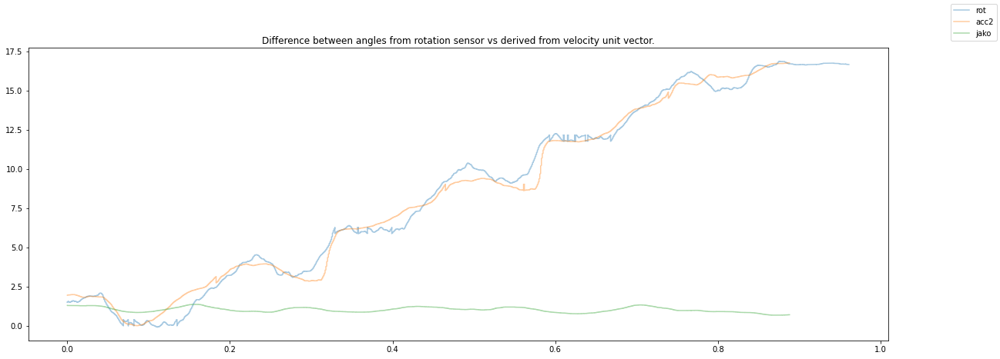

[-25.865626432942435, -25.834072053585402, -25.7139647964122, -25.70249050674545, -25.40734332497547, -25.59782000063319, -25.28670388231052, -25.06574343283029, -24.643917860794062, -24.353536793758337, -23.902594454363907, -23.771933949936795, -23.477134193098436, -23.256921208183655, -23.262373798535066, -23.29246394811389, -23.38159433489767, -23.564481491486617, -23.715036297338003, -23.89229736940345]


(-110.52946334834388, 41.176608311756524)

In [ ]:
useaxis=rotzcorr

#useaxis=[z for z in useaxis]
useaxis2=[]
top=0
boundary = math.pi/4
zprev=useaxis[0]
counter=0
for z in useaxis:
  counter+=1
  if counter % 50 == 0:
    continue

  z=(z)%(2*math.pi)
  if z - zprev < -boundary+0.01:
    top += math.pi
  elif z - zprev > boundary-0.01:
    top -= math.pi
  if z - zprev < -boundary+0.01:
    top += math.pi*7/8
  elif z - zprev > boundary-0.01:
    top -= math.pi*7/8

  zprev=z

  useaxis2.append(z + top)

#useaxis=useaxis2

diffangles=[]

accangles=acc2rot_z(vxs,vys,vzs)
prod=[(y+1)/(x+1) for x,y in zip(vxs,vys)]
print(useaxis[0:100])
print(accangles[0:100])
print(min(accangles))

for r,a in zip(np.rad2deg(useaxis[0:len(accangles)]), np.rad2deg(accangles)):



  d=(r - a + 180) % (2*180) - 180
  diffangles.append(d)
"""
  d  = r-a
  if d >180:
    d = 360 - d
  elif d < -180:
    d = -360-d
"""

accangles2=[]
top=0
boundary = math.pi/4
aprev=accangles[0]
for a in accangles:
 if a - aprev < -boundary+0.01:
    top += math.pi
 elif a - aprev > boundary-0.01:
    top -= math.pi
 if a - aprev < -boundary+0.01:
    top += math.pi*7/8
 elif a - aprev > boundary-0.01:
    top -= math.pi*7/8
 aprev=a

 accangles2.append((a + top))




#accangles=[a+math.pi if a<0 else a for a in accangles]
#accangles=accangles2
print(accangles[0:100])

fig = plt.figure(figsize=(20,7))
ax = fig.add_subplot()
#o=ax.plot(minutes[0:len(diffangles)],diffangles, label="diff between angles (deg)", alpha=0.4)
#o=ax.plot(minutes[0:len(accangles)],accangles, label="acc", alpha=0.4)
#o=ax.plot(minutes[0:len(useaxis)],useaxis, label="rot", alpha=0.4)
o=ax.plot(minutes[0:len(useaxis2)],useaxis2, label="rot", alpha=0.4)
o=ax.plot(minutes[0:len(accangles2)],accangles2, label="acc2", alpha=0.4)
o=ax.plot(minutes[0:len(prod)],prod, label="jako", alpha=0.4)
ax.set_title("Difference between angles from rotation sensor vs derived from velocity unit vector.")
o=fig.legend()
plt.show()
print(diffangles[0:20])
min(diffangles),max(diffangles)

[1.5058874812651881, 1.5064869845432884, 1.5086712294533644, 1.5090063324956322, 1.514343872078875, 1.5112542759435819, 1.5169603906089382, 1.5211189448730407, 1.5287866800941075, 1.5341505942997342, 1.5423143863753745, 1.5448626286151343, 1.5502288368722628, 1.5542544881637852, 1.5543288081820616, 1.5539871325058519, 1.552649538851508, 1.549726733550001, 1.547430344796636, 1.5447338691212806, 1.5416034362890656, 1.5394385364545986, 1.5370415591408744, 1.5351570092148643, 1.5326057375841486, 1.5296627761731845, 1.5258685389649216, 1.522080668991718, 1.5174880716540642, 1.5138553167030278, 1.5089386728242093, 1.5057127598427016, 1.5019596950971135, 1.5012811958750518, 1.4998954573528636, 1.4999583284241256, 1.5003349623561544, 1.5012475073172658, 1.5035252005206763, 1.5059493572141633, 1.5076781701102906, 1.511050757712436, 1.51255083729386, 1.5146515183095435, 1.5166075029525858, 1.51692288287407, 1.5180470496931342, 1.5174841257513147, 1.5168516946688477, 1.516424386047424, 1.51738210

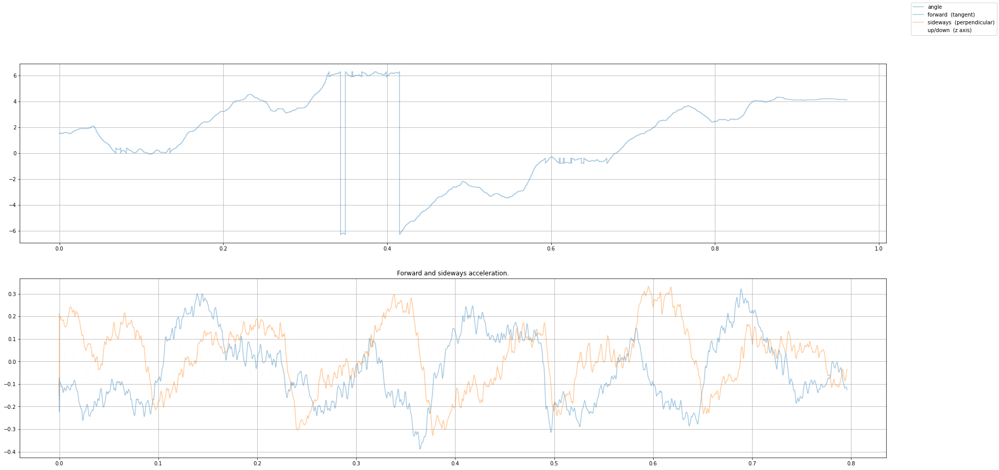

In [ ]:
math.pi

afwd=[]
aside=[]
azs=[]
ats=[]

ts = [row[0] for row in rot]

accel = list(zip(smootht[window_size:-1],smoothx[window_size:-1],smoothy[window_size:-1],smoothz[window_size:-1]))
a =accel.pop(0)
new_ats=a[0]
#ats.append(new_ats)
for direction,t in zip(accangles,ts):
  # scan accelerations until matching ts
  if len(accel)==0:
    break
  while(new_ats<t):
    a = accel.pop(0)
    new_ats = a[0]
  ats.append(new_ats)
  ax = a[1]
  ay = a[2]
  az = a[3]

  afwd.append( ax*math.cos(direction)-ay*math.sin(direction) )
  aside.append( ax*math.sin(direction)+ay*math.cos(direction) )
  azs.append(az)

print(rotzcorr)
print(len(ats),len(afwd))
print(afwd[0:15])
print(ats[0:15])
print(ts[0:15])
print(ts[-1])

atsminutes=[(t-ats[0])/1000.0/1000.0/1000.0/60.0 for t in ats]


useaxis3=[z if abs(z) < 2*math.pi else z -(z/abs(z))* math.pi*4 for z in useaxis2]

fig = plt.figure(figsize=(30,14))
ax = fig.add_subplot(2,1,1)
o=ax.plot(minutes[0:len(useaxis2)] ,useaxis3, label="angle", alpha=0.4)
ax.grid()
ax = fig.add_subplot(2,1,2)
o=ax.plot(atsminutes,afwd, label="forward  (tangent)", alpha=0.4)
o=ax.plot(atsminutes,aside, label="sideways  (perpendicular)", alpha=0.4)
o=ax.plot(atsminutes,azs, label="up/down  (z axis)", alpha=0.01)
ax.grid()
print(mean(afwd))
print(mean(aside))

ax.set_title("Forward and sideways acceleration.")
o=fig.legend()
plt.show()


In [ ]:
fig = plt.figure(figsize=(21,5),dpi=200)
ax = fig.add_subplot(projection='3d')

afwd[0]=0
aside[0]=0
afwd[-1]=0
aside[-1]=0



fbase=max(max(afwd),abs(min(afwd)),1)
print(max(afwd),abs(min(afwd)),1)
print(fbase)
colors=[(a/fbase/2+0.7,0,0) if a>0 else (0,0,-a/fbase/2+0.7) for a in afwd]
zeros=[0.0]*len(ats)
o=ax.scatter(ats,zeros,[-x for x in afwd], label="forward  (tangent)", marker=',', alpha=0.3, color=colors)


sbase=max(max(aside),abs(min(aside)),1)
colors=[(0.0,abs(a/sbase)/2+0.7,abs(a/sbase)/2*0.7) for a in aside]
o=ax.scatter(ats,[-x for x in aside],zeros, label="sideways  (perpendicular)", marker=',', alpha=0.6,color=colors)
#o=ax.plot(ats,azs, label="up/down  (z axis)", alpha=0.4)

shift=3
useaxis=useaxis3
xs=[-math.cos(a)-shift for a in useaxis]
ys=[-math.sin(a) for a in useaxis]

o=ax.plot(ts[0:len(xs)],xs,ys, label="angle", alpha=0.5, color=(0.5,0.5,0.7), marker='.')
o=ax.plot(ts[0:len(xs)],[0]*len(xs),[0]*len(xs), label="angle", alpha=1.0, color=(0.5,0.5,0.7), marker='.')
o=ax.plot(ts[0:len(xs)],[-shift]*len(xs),[0]*len(xs), label="angle", alpha=1.0, color='purple', marker='.')
circlex=[math.cos(x)-shift for x in range(0,360)]
circley=[math.sin(y) for y in range(0,360)]
for i in range(0,len(ats),int(len(ats)/30)):
  ax.scatter(ats[i], circlex, circley, marker='.', color='purple', alpha=0.2)


ax.view_init(20, 10, 180)
#ax.set_xlim(ats[0],ats[20000])
ax.set_zlim( 0,fbase)
#ax.set_ylim(-sbase,+sbase)
ax.set_box_aspect((np.ptp(ats)*6, 2*np.ptp(ats), np.ptp(ats)))  # aspect ratio is 1:1:1 in data space
ax.set_title("Forward and sideways acceleration.")
fig.subplots_adjust(top=10.0, bottom=0.0, left=-10.0, right=5.0)
o=fig.legend()
plt.show()

0.32138056378127866 0.38961467656503157 1
1


In [ ]:
len(vxs), len(rotz)

(10681, 11788)

In [ ]:
print(mean(afwd),mean(aside))
print(max(afwd),max(aside))

-0.04873967637917791 0.02042410357032552
0.32138056378127866 0.3319188678492496


In [ ]:
x=(21.93803873133961, -111.9124089209382, -236.91450208608984)
y=(156.719172700207, 33.155076391134564, -44.00769551001108)
z=(73.76616890984933, 31.994339039672877, -6.747646582556207)
x2=(x[0]-x[2])*(x[0]-x[2])
y2=(y[0]-y[2])*(y[0]-y[2])
z2=(z[0]-z[2])*(z[0]-z[2])
l=math.sqrt(x2+y2+z2)
l

337.3105216180876

0.32138056378127866
[0, -0.14448776657046788, -0.14450267952052198, -0.14452553363301185, -0.14455709710368625, -0.14459688952706648, -0.14464366362991168, -0.14469482155211372, -0.14474654580081897, -0.144796617927192, -0.14484626367258815, -0.14489157010604295, -0.1449289499395396, -0.14495976599722712, -0.1449884258025087, -0.14501945012586953, -0.14505630595091973, -0.14510179931741526, -0.14515777547526082, -0.14522488660174876, -0.14530307655417696, -0.14539053409375502, -0.14548425906363033, -0.1455810473571227, -0.14567812538775216, -0.14577310977734872, -0.14586414238443007, -0.14594978477648135, -0.14602933339639323, -0.14610283295941706, -0.14617087184113742, -0.14623428285743267, -0.14629439790652832, -0.14635322086117974, -0.14641323581050603, -0.14647692830199563, -0.1465458209817699, -0.14662062256130706, -0.1467018995696271, -0.1467902879876693, -0.14688579839841853, -0.14698798284778317, -0.1470953810497588, -0.14720644759540774, -0.14731990109589865, -0.14743522557948

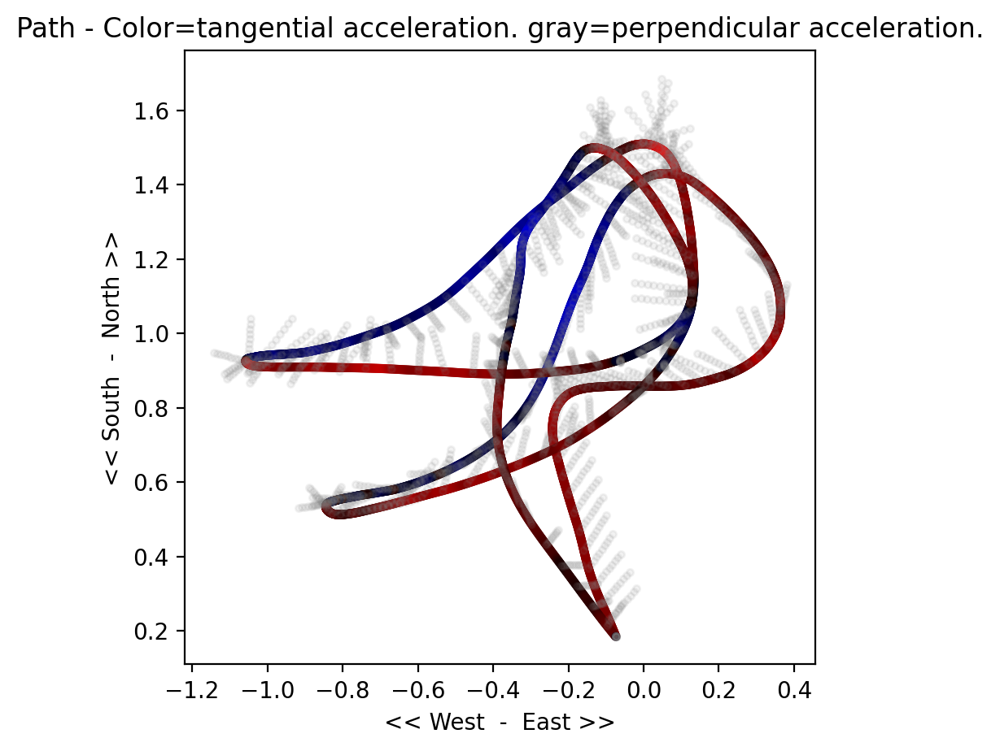

In [ ]:
fig = plt.figure(figsize=(5,5),dpi=200)
ax = fig.add_subplot()
#ax.set_zlim()
print(max(afwd))
fbase=max(max(afwd),abs(min(afwd)))
colors=[(-a/fbase*0.9+0.1,0,0) if a<0 else (0,0,a/fbase*0.9+0.1) for a in afwd]

ax.scatter(xxs[:-1], yys[:-1], marker='.', color=colors, alpha=0.5)


sidex=[x+math.cos(a)*math.sqrt(side*side+side2*side2) for a,x,y,side,side2 in zip(accangles,xxs,yys,aside,afwd)]
sidey=[ y+math.sin(a)*math.sqrt(side*side+side2*side2) for a,x,y,side,side2 in zip(accangles,xxs,yys,aside,afwd)]
sidex=[x-side/2 for a,x,y,side,side2 in zip(accangles,xxs,yys,aside,afwd)]
sidey=[ y-side2/2 for a,x,y,side,side2 in zip(accangles,xxs,yys,aside,afwd)]
for i in range(0,len(xxs),50):
  accelside=np.linspace([xxs[i],yys[i]],[sidex[i],sidey[i]],10)
  ax.scatter([x for x,y in accelside], [y for x,y in accelside], marker='.', color='gray', alpha=0.1)

print(aside)
ax.set_xlabel('<< West  -  East >>')
ax.set_ylabel('<< South  -  North >>')

print((max(xxs),mean(xxs),min(xxs)))
print((max(yys),mean(yys),min(yys)))
print((max(zzs),mean(zzs),min(zzs)))
plt.title("Path - Color=tangential acceleration. gray=perpendicular acceleration.")

plt.show()